In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from keras.layers import Dense, Dropout
from keras.regularizers import l1, l2, l1_l2
from sklearn.preprocessing import StandardScaler

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [4]:
df = pd.read_csv("final_data.csv")
df

,player,team,name,position,height,age,appearance,goals,assists,yellow cards,...,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
0,/david-de-gea/profil/spieler/59377,Manchester United,David de Gea,Goalkeeper,189.000000,32.0,104,0.000000,0.000000,0.009585,...,1.217252,0.335463,9390,42,5,13,15000000,70000000,1,0
1,/jack-butland/profil/spieler/128899,Manchester United,Jack Butland,Goalkeeper,196.000000,30.0,15,0.000000,0.000000,0.069018,...,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,0
2,/tom-heaton/profil/spieler/34130,Manchester United,Tom Heaton,Goalkeeper,188.000000,37.0,4,0.000000,0.000000,0.000000,...,0.616438,0.924658,292,697,84,4,600000,6000000,1,0
3,/lisandro-martinez/profil/spieler/480762,Manchester United,Lisandro Martínez,Defender Centre-Back,175.000000,25.0,82,0.028090,0.056180,0.224719,...,0.000000,0.000000,6408,175,22,9,50000000,50000000,2,0
4,/raphael-varane/profil/spieler/164770,Manchester United,Raphaël Varane,Defender Centre-Back,191.000000,30.0,63,0.017889,0.017889,0.053667,...,0.000000,0.000000,5031,238,51,21,40000000,80000000,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,/aidan-simmons/profil/spieler/867763,Western Sydney Wanderers,Aidan Simmons,Attack-RightWinger,181.240353,20.0,16,0.175953,0.087977,0.263930,...,0.000000,0.000000,1023,0,0,0,75000,75000,4,1
10750,/kusini-yengi/profil/spieler/708099,Western Sydney Wanderers,Kusini Yengi,Attack Centre-Forward,190.000000,24.0,26,0.372671,0.186335,0.186335,...,0.000000,0.000000,1449,102,18,0,300000,300000,4,0
10751,/nathanael-blair/profil/spieler/1023268,Western Sydney Wanderers,Nathanael Blair,Attack Centre-Forward,181.240353,19.0,20,0.375000,0.000000,0.187500,...,0.000000,0.000000,960,0,0,0,50000,50000,4,0
10752,/zachary-sapsford/profil/spieler/703657,Western Sydney Wanderers,Zachary Sapsford,Attack Centre-Forward,181.240353,20.0,17,0.312139,0.104046,0.000000,...,0.000000,0.000000,865,0,0,0,50000,50000,4,0


In [5]:
# df.shape
df = df.drop(['player', 'name', "position_encoded"], axis=1)

In [6]:
team_map = {0: False, 1: True}
df["winger"] = df["winger"].replace(team_map)

In [7]:
features = list(df.columns)
features.remove('current_value')
features

['team',
 'position',
 'height',
 'age',
 'appearance',
 'goals',
 'assists',
 'yellow cards',
 'second yellow cards',
 'red cards',
 'goals conceded',
 'clean sheets',
 'minutes played',
 'days_injured',
 'games_injured',
 'award',
 'highest_value',
 'winger']

In [8]:
target = ['current_value']

# **EDA**

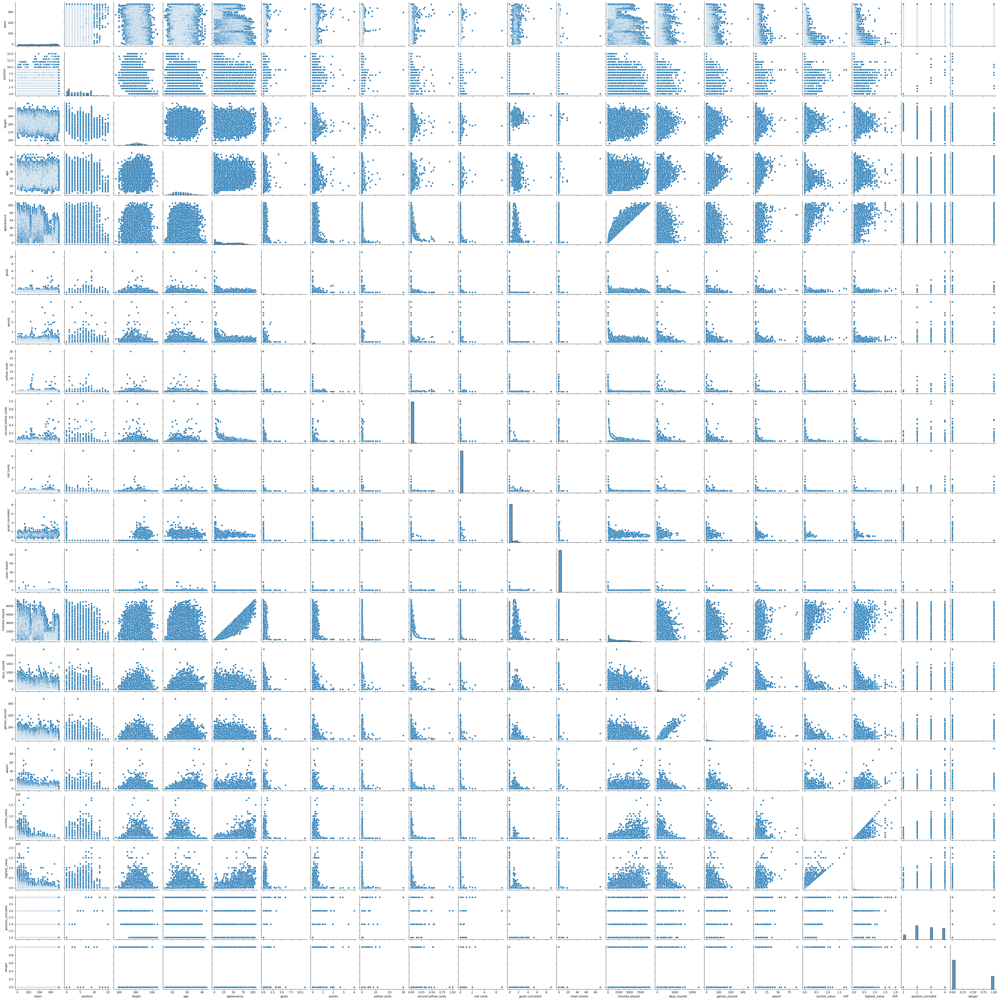

In [ ]:
sns.pairplot(df)

In [ ]:
corr_matrix = df.corr(numeric_only=True)
corr_matrix

,team,position,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
team,1.000000,0.081306,-0.183457,0.005707,-0.475546,-0.045652,-0.066684,-0.014710,0.001734,0.000075,-0.034580,-0.015772,-0.432831,-0.226610,-0.247532,-0.160842,-0.384862,-0.418336,0.028395,0.000616
position,0.081306,1.000000,-0.376875,-0.133473,0.053776,0.421589,0.306202,0.038689,-0.015640,-0.000278,-0.394802,-0.064399,-0.100204,-0.024955,-0.021264,0.007956,0.047226,0.062664,0.887025,0.137844
height,-0.183457,-0.376875,1.000000,0.063652,0.060641,-0.055962,-0.202441,-0.037974,-0.005112,-0.005693,0.333092,0.044366,0.132887,0.059392,0.054902,0.013976,0.040535,0.036776,-0.378333,-0.381728
age,0.005707,-0.133473,0.063652,1.000000,0.139846,-0.034805,-0.024156,0.007085,0.015529,0.003074,0.083343,0.039064,0.169020,0.324267,0.343029,0.363478,-0.050156,0.123468,-0.107469,-0.047808
appearance,-0.475546,0.053776,0.060641,0.139846,1.000000,0.131469,0.157186,-0.023092,-0.007436,-0.024514,-0.101384,-0.032515,0.945365,0.127369,0.147528,0.222139,0.419656,0.418394,0.129357,0.038713
goals,-0.045652,0.421589,-0.055962,-0.034805,0.131469,1.000000,0.218266,-0.012826,-0.013974,-0.013940,-0.158107,-0.025811,0.050863,0.037527,0.041696,0.099617,0.121574,0.129037,0.434600,-0.004581
assists,-0.066684,0.306202,-0.202441,-0.024156,0.157186,0.218266,1.000000,-0.004430,0.019551,-0.013189,-0.180607,-0.029460,0.081136,0.039431,0.049383,0.091569,0.137415,0.145407,0.324714,0.177580
yellow cards,-0.014710,0.038689,-0.037974,0.007085,-0.023092,-0.012826,-0.004430,1.000000,0.028739,-0.003007,-0.093675,-0.017122,-0.039652,0.011461,0.012892,-0.009052,-0.011766,-0.009772,0.077185,0.010097
second yellow cards,0.001734,-0.015640,-0.005112,0.015529,-0.007436,-0.013974,0.019551,0.028739,1.000000,-0.002562,-0.045840,-0.006770,-0.010411,0.003772,0.007090,-0.015231,-0.013889,-0.014155,0.005766,-0.007259
red cards,0.000075,-0.000278,-0.005693,0.003074,-0.024514,-0.013940,-0.013189,-0.003007,-0.002562,1.000000,-0.004584,-0.001778,-0.024402,-0.003650,-0.004764,-0.007886,-0.010171,-0.007257,0.004614,-0.007026


In [ ]:
corr_matrix["current_value"].sort_values(ascending=False)

current_value          1.000000
highest_value          0.834553
minutes played         0.420542
appearance             0.419656
award                  0.300454
assists                0.137415
games_injured          0.135654
goals                  0.121574
days_injured           0.107686
position_encoded       0.085154
position               0.047226
height                 0.040535
winger                 0.005034
red cards             -0.010171
clean sheets          -0.011684
yellow cards          -0.011766
second yellow cards   -0.013889
age                   -0.050156
goals conceded        -0.063529
team                  -0.384862
Name: current_value, dtype: float64

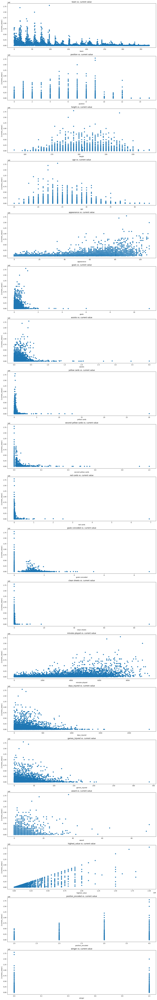

In [ ]:
plt.figure(figsize=(15, 5 * len(features)))  # Here, '5' is the height of each subplot, adjust as necessary

for i, feature in enumerate(features, 1):
    plt.subplot(len(features), 1, i)  # Creates a subplot for each feature
    plt.scatter(df[feature], df[target])  # Plots the feature against the target
    plt.title(f'{feature} vs. current value')  # Sets the title for each subplot
    plt.xlabel(feature)  # Sets the x-label to the feature name
    plt.ylabel(target)  # Sets the y-label to the target name

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area
plt.show()

# **EDA (organized)**

In [ ]:
categorical_features = ["team", "position", "winger"]
numerical_features = [f for f in features if f not in categorical_features]

## **Distribution Analysis**

Getting the distribution of numerical features:

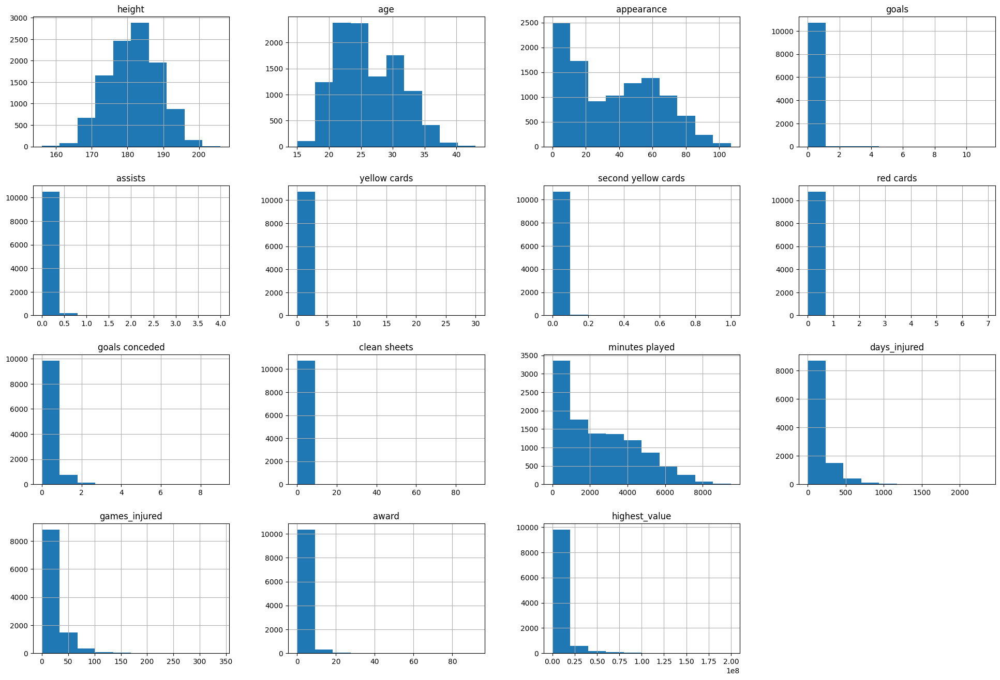

In [ ]:
# histogram
df[numerical_features].hist(figsize=(24, 16))
plt.show()

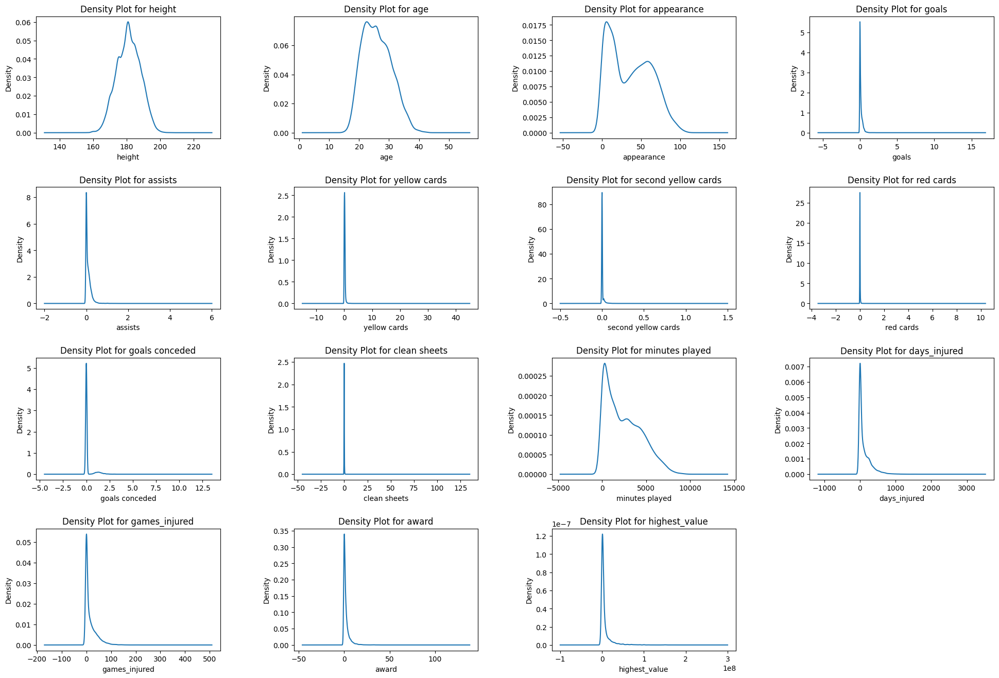

In [ ]:
# Density
n_features = len(numerical_features)
n_cols = 4
n_rows = n_features // n_cols + (n_features % n_cols > 0)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, 4 * n_rows))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i, feature in enumerate(numerical_features):
    row = i // n_cols
    col = i % n_cols
    if n_rows > 1:
        ax = axs[row, col]
    else:
        ax = axs[col]
    df[feature].plot(kind='density', ax=ax)
    ax.set_title(f'Density Plot for {feature}')
    ax.set_xlabel(feature)
    ax.set_ylabel('Density')

for i in range(n_features, n_rows * n_cols):
    row = i // n_cols
    col = i % n_cols
    if n_rows > 1:
        axs[row, col].axis('off')
    else:
        axs[col].axis('off')

plt.show()

Getting the distribution of categorical features:

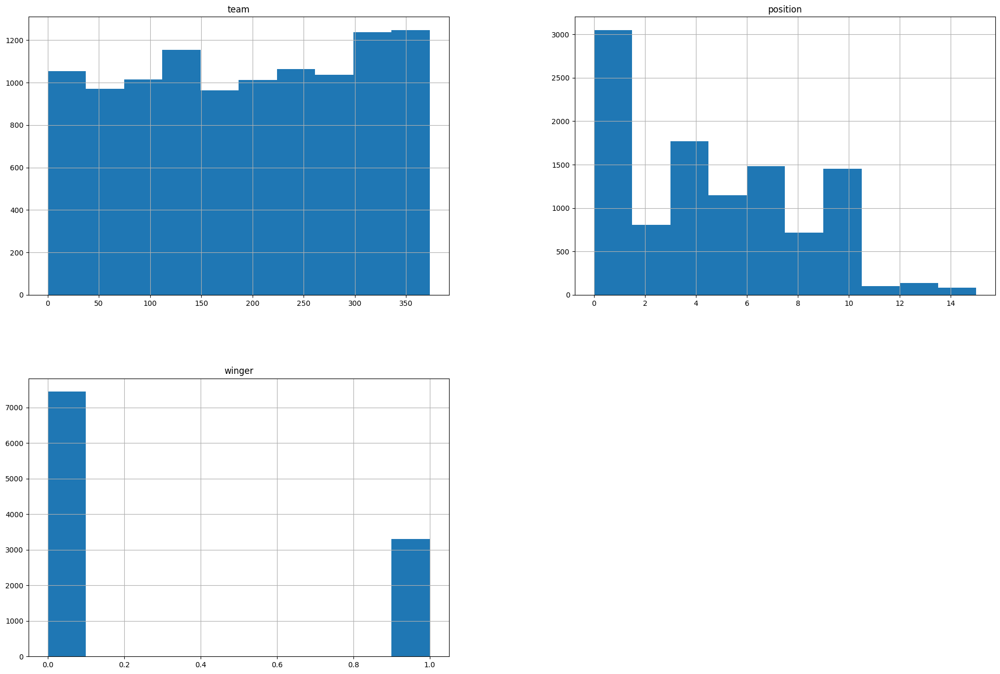

In [ ]:
df[categorical_features].hist(figsize=(24, 16))
plt.show()

## **Pairwise Relationships Analysis**

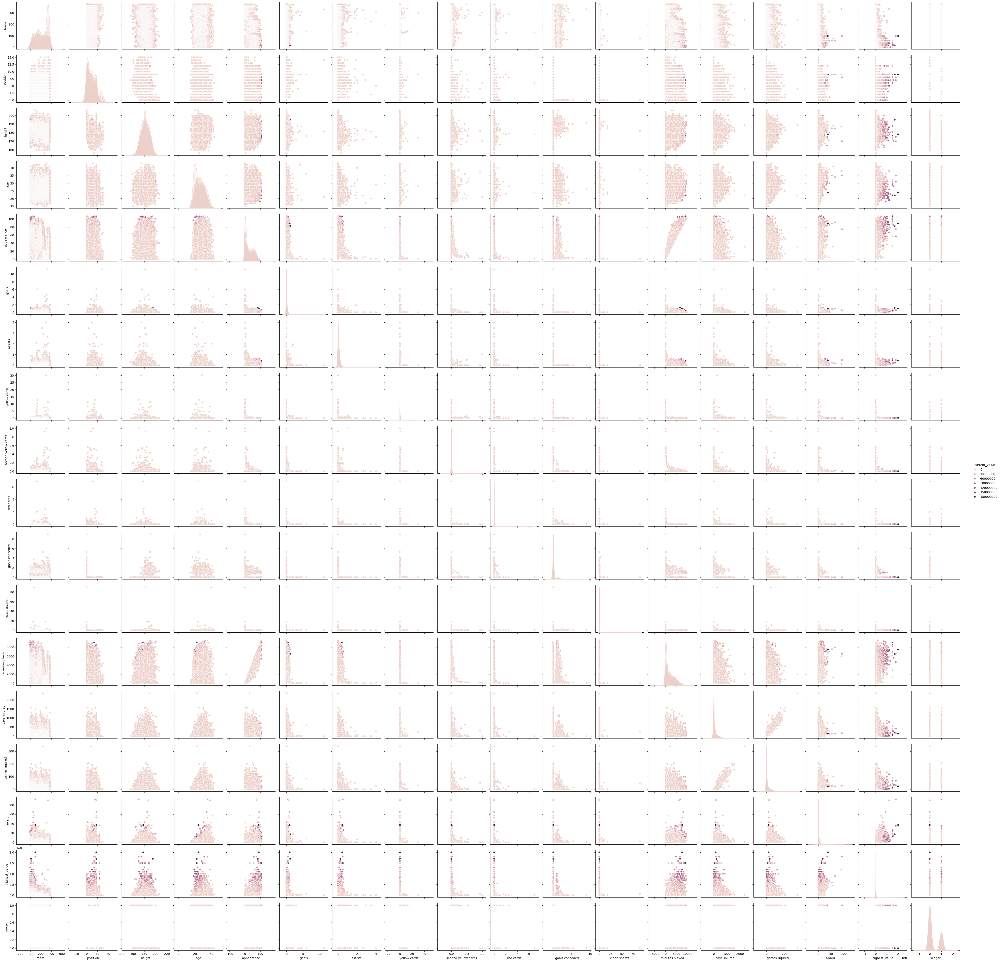

In [ ]:
sns.pairplot(df[features + target], hue='current_value')
plt.show()

## **Correlation Analysis**

In [ ]:
corr_matrix = df.corr(numeric_only=True)
corr_matrix

,team,position,height,age,appearance,goals,assists,yellow cards,second yellow cards,red cards,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,winger
team,1.000000,0.081306,-0.183457,0.005707,-0.475546,-0.045652,-0.066684,-0.014710,0.001734,0.000075,-0.034580,-0.015772,-0.432831,-0.226610,-0.247532,-0.160842,-0.384862,-0.418336,0.000616
position,0.081306,1.000000,-0.376875,-0.133473,0.053776,0.421589,0.306202,0.038689,-0.015640,-0.000278,-0.394802,-0.064399,-0.100204,-0.024955,-0.021264,0.007956,0.047226,0.062664,0.137844
height,-0.183457,-0.376875,1.000000,0.063652,0.060641,-0.055962,-0.202441,-0.037974,-0.005112,-0.005693,0.333092,0.044366,0.132887,0.059392,0.054902,0.013976,0.040535,0.036776,-0.381728
age,0.005707,-0.133473,0.063652,1.000000,0.139846,-0.034805,-0.024156,0.007085,0.015529,0.003074,0.083343,0.039064,0.169020,0.324267,0.343029,0.363478,-0.050156,0.123468,-0.047808
appearance,-0.475546,0.053776,0.060641,0.139846,1.000000,0.131469,0.157186,-0.023092,-0.007436,-0.024514,-0.101384,-0.032515,0.945365,0.127369,0.147528,0.222139,0.419656,0.418394,0.038713
goals,-0.045652,0.421589,-0.055962,-0.034805,0.131469,1.000000,0.218266,-0.012826,-0.013974,-0.013940,-0.158107,-0.025811,0.050863,0.037527,0.041696,0.099617,0.121574,0.129037,-0.004581
assists,-0.066684,0.306202,-0.202441,-0.024156,0.157186,0.218266,1.000000,-0.004430,0.019551,-0.013189,-0.180607,-0.029460,0.081136,0.039431,0.049383,0.091569,0.137415,0.145407,0.177580
yellow cards,-0.014710,0.038689,-0.037974,0.007085,-0.023092,-0.012826,-0.004430,1.000000,0.028739,-0.003007,-0.093675,-0.017122,-0.039652,0.011461,0.012892,-0.009052,-0.011766,-0.009772,0.010097
second yellow cards,0.001734,-0.015640,-0.005112,0.015529,-0.007436,-0.013974,0.019551,0.028739,1.000000,-0.002562,-0.045840,-0.006770,-0.010411,0.003772,0.007090,-0.015231,-0.013889,-0.014155,-0.007259
red cards,0.000075,-0.000278,-0.005693,0.003074,-0.024514,-0.013940,-0.013189,-0.003007,-0.002562,1.000000,-0.004584,-0.001778,-0.024402,-0.003650,-0.004764,-0.007886,-0.010171,-0.007257,-0.007026


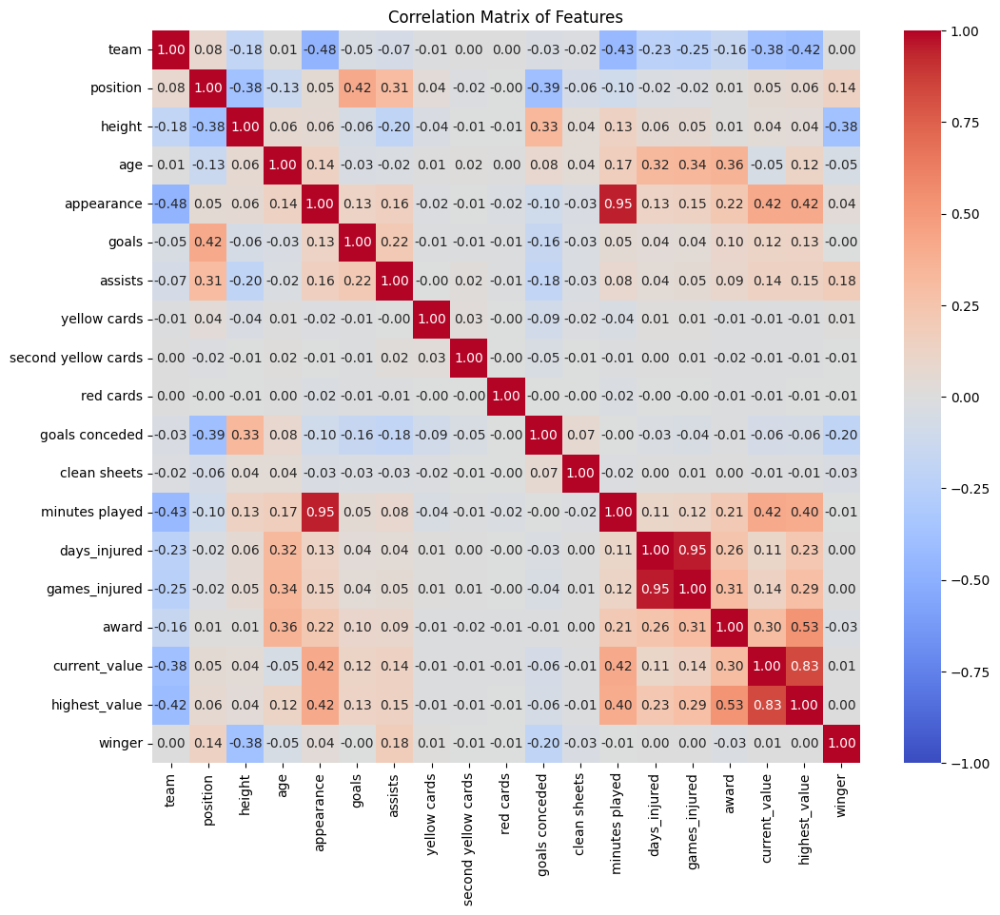

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix of Features")
plt.show()

## **PCA**

In [ ]:
pca = PCA(n_components=3)

principal_components = pca.fit_transform(df[features])

df_pca = pd.DataFrame(data=principal_components, columns=[f'Principal Component {i}' for i in range(principal_components.shape[1])])
df_pca

,Principal Component 0,Principal Component 1,Principal Component 2
0,6.384739e+07,-3067.707410,-286.510630
1,1.584739e+07,2119.492540,365.804630
2,-1.526061e+05,2165.327785,609.137095
3,4.384739e+07,-1293.536095,-77.833603
4,7.384739e+07,1894.154956,-105.362737
...,...,...,...
10749,-6.077606e+06,1084.124403,-114.030395
10750,-5.852606e+06,671.521447,-13.380905
10751,-6.102606e+06,1145.553378,-113.727632
10752,-6.102606e+06,1240.568439,-113.401035


# **Data Preprocessing**

In [9]:
df = df.drop(['days_injured', 'appearance'], axis=1)

In [10]:
df.duplicated().sum()
df.drop_duplicates(inplace=True)

In [11]:
df.isna().sum()

team                   0
position               0
height                 0
age                    0
goals                  0
assists                0
yellow cards           0
second yellow cards    0
red cards              0
goals conceded         0
clean sheets           0
minutes played         0
games_injured          0
award                  0
current_value          0
highest_value          0
winger                 0
dtype: int64

In [12]:
num_cols = df.select_dtypes(include='number').columns.to_list()
num_cols.remove("current_value")  # Exclude the target from numerical columns

# Select categorical columns
cat_cols = df.select_dtypes(exclude='number').columns.to_list()

# Create pipelines for numeric and categorical columns
num_pipeline = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
cat_pipeline = make_pipeline(SimpleImputer(strategy='most_frequent'), OrdinalEncoder())

# Use ColumnTransformer to set the estimators and transformations
preprocessing = ColumnTransformer(
    [('num', num_pipeline, num_cols),
     ('cat', cat_pipeline, cat_cols)],
    remainder='passthrough'
)

In [13]:
preprocessing

ColumnTransformer(remainder='passthrough',
                  transformers=[('num',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['height', 'age', 'goals', 'assists',
                                  'yellow cards', 'second yellow cards',
                                  'red cards', 'goals conceded', 'clean sheets',
                                  'minutes played', 'games_injured', 'award',
                                  'highest_value']),
                                ('cat',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder())]),
                                 ['team', 'position', 'winger'])])

In [14]:
df_prepared = preprocessing.fit_transform(df)
feature_names=preprocessing.get_feature_names_out()
df_prepared = pd.DataFrame(data=df_prepared, columns=feature_names)
df_prepared

,num__height,num__age,num__goals,num__assists,num__yellow cards,num__second yellow cards,num__red cards,num__goals conceded,num__clean sheets,num__minutes played,num__games_injured,num__award,num__highest_value,cat__team,cat__position,cat__winger,remainder__current_value
0,1.113373e+00,1.247140,-0.532971,-0.606773,-0.416711,-0.184919,-0.084128,2.454353,0.314349,3.422625,-0.463008,2.948703,4.768555,226.0,9.0,0.0,15000000.0
1,2.117750e+00,0.828503,-0.532971,-0.606773,-0.279250,-0.184919,-0.084128,2.511052,0.175438,-0.577159,1.803642,-0.256629,1.183591,226.0,9.0,0.0,1500000.0
2,9.698906e-01,2.293733,-0.532971,-0.606773,-0.438879,-0.184919,-0.084128,1.096013,0.951733,-1.077750,2.915584,0.544704,-0.011398,226.0,9.0,0.0,600000.0
3,-8.953810e-01,-0.218090,-0.413731,-0.214852,0.080861,-0.184919,-0.084128,-0.297651,-0.048552,1.947563,0.264031,1.880259,3.274820,226.0,6.0,0.0,50000000.0
4,1.400338e+00,0.828503,-0.457033,-0.481975,-0.314755,-0.184919,-0.084128,-0.297651,-0.048552,1.266422,1.504273,5.085590,5.515423,226.0,6.0,0.0,40000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10749,-2.527020e-09,-1.264683,0.213940,0.006968,0.171549,-0.184919,-0.084128,-0.297651,-0.048552,-0.716157,-0.676843,-0.523740,-0.453917,365.0,3.0,1.0,75000.0
10750,1.256856e+00,-0.427408,1.048996,0.693139,-0.007914,-0.184919,-0.084128,-0.297651,-0.048552,-0.505434,0.092963,-0.523740,-0.437112,365.0,1.0,0.0,300000.0
10751,-2.527020e-09,-1.474001,1.058884,-0.606773,-0.005221,-0.184919,-0.084128,-0.297651,-0.048552,-0.747320,-0.676843,-0.523740,-0.455784,365.0,1.0,0.0,50000.0
10752,-2.527020e-09,-1.264683,0.792041,0.119074,-0.438879,-0.184919,1.198195,-0.297651,-0.048552,-0.794312,-0.676843,-0.523740,-0.455784,365.0,1.0,0.0,50000.0


In [15]:
X = df_prepared[feature_names]
Y = df_prepared["remainder__current_value"]

# **TRAINING MODELS**

In [16]:
X_train_temp, X_temp, Y_train_temp, Y_temp = train_test_split(X, Y, test_size=0.2, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)

## **Linear/Polynomial Regression**

In [17]:
model = LinearRegression()
model.fit(X_train_temp, Y_train_temp)

LinearRegression()

In [18]:
val_predictions = model.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

3.795638997951095e-09

In [19]:
test_predictions = model.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

3.6449440803413365e-09

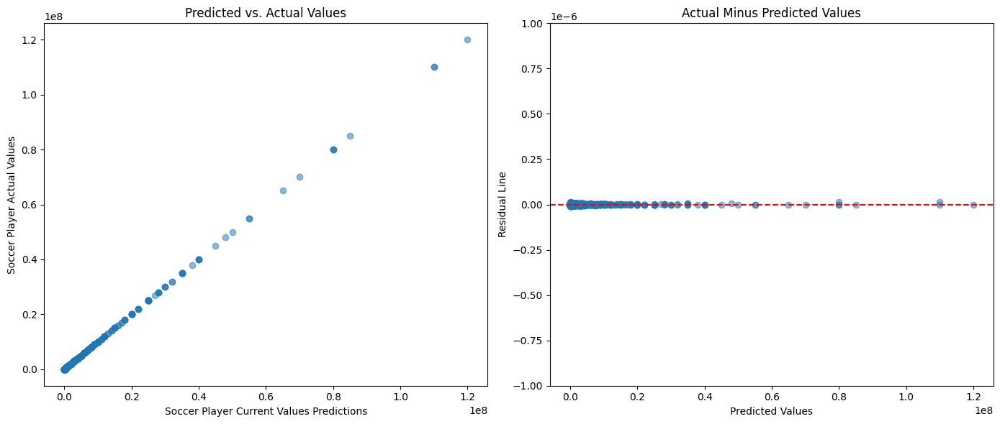

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

axes[0].scatter(test_predictions, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

residuals = Y_test - test_predictions
axes[1].scatter(test_predictions, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residual Line')

axes[1].set_ylim(-1e-6, 1e-6)

plt.tight_layout()
plt.show()

In [23]:
poly = PolynomialFeatures(degree=2, include_bias=False)
poly_features = poly.fit_transform(X_train_temp)

In [24]:
model = LinearRegression()
model.fit(poly_features, Y_train_temp)

LinearRegression()

In [25]:
poly_features_val = poly.fit_transform(X_val)
val_predictions = model.predict(poly_features_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

0.0002512035638985623

In [26]:
poly_features_test = poly.fit_transform(X_test)
test_predictions = model.predict(poly_features_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

0.00026164287737876456

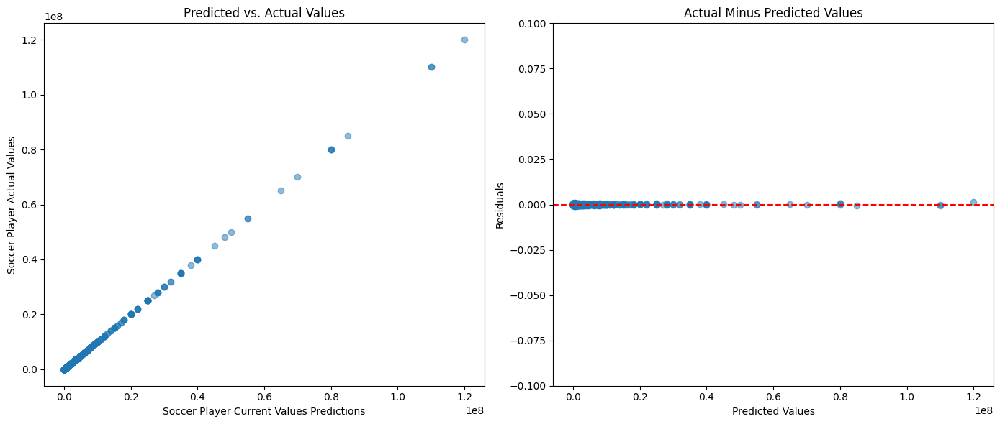

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

axes[0].scatter(test_predictions, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

residuals = Y_test - test_predictions
axes[1].scatter(test_predictions, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')

axes[1].set_ylim(-1e-1, 1e-1)

plt.tight_layout()
plt.show()

## **Random Forest Regression**

In [28]:
rf = RandomForestRegressor(n_estimators=25, random_state=42)
rf.fit(X_train_temp, Y_train_temp)

RandomForestRegressor(n_estimators=25, random_state=42)

In [29]:
val_predictions = rf.predict(X_val)
val_mse = mean_squared_error(Y_val, val_predictions)
np.sqrt(val_mse)

150626.5642589816

In [30]:
test_predictions = rf.predict(X_test)
test_mse = mean_squared_error(Y_test, test_predictions)
np.sqrt(test_mse)

756915.7030012087

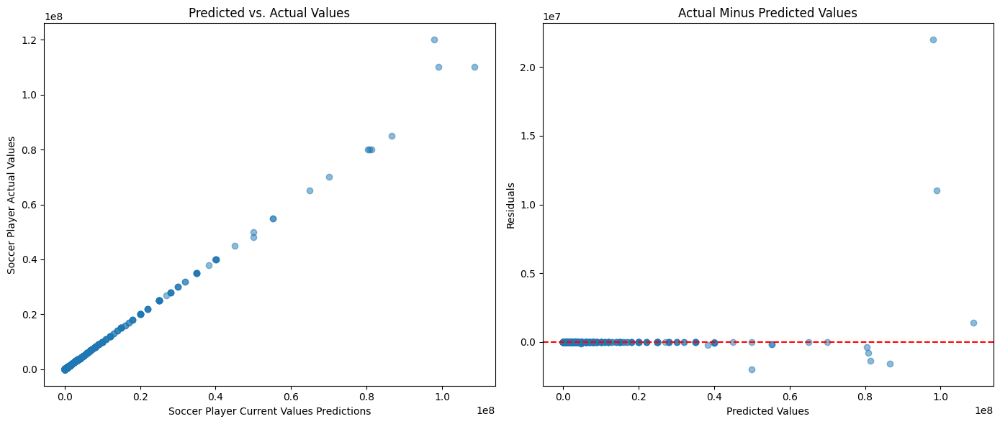

In [31]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

axes[0].scatter(test_predictions, Y_test, alpha=0.5)
axes[0].set_xlabel("Soccer Player Current Values Predictions")
axes[0].set_ylabel("Soccer Player Actual Values")
axes[0].set_title("Predicted vs. Actual Values")

residuals = Y_test - test_predictions
axes[1].scatter(test_predictions, residuals, alpha=0.5)
axes[1].axhline(y=0, color='r', linestyle='--')
axes[1].set_title('Actual Minus Predicted Values')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')

plt.tight_layout()
plt.show()

## **Neural Network**

In [ ]:
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train_temp.shape[1],)),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
history = model.fit(X_train_temp, Y_train_temp, epochs=50, validation_data=(X_val, Y_val), verbose=1)
model.save('nn.h5')

Epoch 1/100
269/269 [==============================] - 1s 2ms/step - loss: 93911062151168.0000 - val_loss: 82412914606080.0000
Epoch 2/100
269/269 [==============================] - 1s 2ms/step - loss: 93911036985344.0000 - val_loss: 82412914606080.0000
Epoch 3/100
269/269 [==============================] - 1s 2ms/step - loss: 93911011819520.0000 - val_loss: 82412914606080.0000
Epoch 4/100
 25/269 [=>............................] - ETA: 0s - loss: 112454432456704.0000

KeyboardInterrupt: 